In [1]:
# re do our data read combining all the anlysis we did here there are 7 SEVEN macids
readData = 
  function(filename = 'offline.final.trace.txt', 
           subMacs = c("00:0f:a3:39:e1:c0", "00:0f:a3:39:dd:cd", "00:14:bf:b1:97:8a",
                       "00:14:bf:3b:c7:c6", "00:14:bf:b1:97:90", "00:14:bf:b1:97:8d",
                       "00:14:bf:b1:97:81"))
  {
    txt = readLines(filename)
    lines = txt[ substr(txt, 1, 1) != "#" ]
    tmp = lapply(lines, processLine)
    offline = as.data.frame(do.call("rbind", tmp), 
                            
                            stringsAsFactors= FALSE) 
    
    names(offline) = c("time", "scanMac", 
                       "posX", "posY", "posZ", "orientation", 
                       "mac", "signal", "channel", "type")
    
    # keep only signals from access points
    offline = offline[ offline$type == "3", ]
    
    # drop scanMac, posZ, channel, and type - no info in them
    dropVars = c("scanMac", "posZ", "channel", "type")
    offline = offline[ , !( names(offline) %in% dropVars ) ]
    
    # drop more unwanted access points
    offline = offline[ offline$mac %in% subMacs, ]
    
    # convert numeric values
    numVars = c("time", "posX", "posY", "orientation", "signal")
    offline[ numVars ] = lapply(offline[ numVars ], as.numeric)
    
    # convert time to POSIX
    offline$rawTime = offline$time
    offline$time = offline$time/1000
    class(offline$time) = c("POSIXt", "POSIXct")
    
    # round orientations to nearest 45
    offline$angle = roundOrientation(offline$orientation)
    
    return(offline)
  }

In [2]:
# put it all together to process a line as a function
# note that the if statement handles null values to remove warnings
processLine = function(x)
{
  tokens = strsplit(x, "[;=,]")[[1]]
  if (length(tokens) == 10)
    return(NULL)
  tmp = matrix(tokens[ - (1:10) ], , 4, byrow = TRUE)
  cbind(matrix(tokens[c(2, 4, 6:8, 10)], nrow(tmp), 6,
               byrow = TRUE), tmp)
}

In [3]:
# create a function that will round off to the nearest major angle
roundOrientation = function(angles) {
  refs = seq(0, by = 45, length  = 9)
  q = sapply(angles, function(o) which.min(abs(o - refs)))
  c(refs[1:8], 0)[q]
}

In [4]:
#setwd(dirname(rstudioapi::getSourceEditorContext()$path))
#library(codetools)
#findGlobals(readData, merge = FALSE)$variables

In [5]:
offline = readData()

In [6]:
#Setup all the data using the data summary
offline$posXY = paste(offline$posX, offline$posY, sep = "-")

byLocAngleAP = with(offline, 
                    by(offline, list(posXY, angle, mac), 
                       function(x) x))

signalSummary = 
  lapply(byLocAngleAP,            
         function(oneLoc) {
           ans = oneLoc[1, ]
           ans$medSignal = median(oneLoc$signal)
           ans$avgSignal = mean(oneLoc$signal)
           ans$num = length(oneLoc$signal)
           ans$sdSignal = sd(oneLoc$signal)
           ans$iqrSignal = IQR(oneLoc$signal)
           ans
         })
#concatanate rows
offlineSummary = do.call("rbind", signalSummary) 

subMacs = c("00:0f:a3:39:e1:c0", "00:0f:a3:39:dd:cd", "00:14:bf:b1:97:8a",
            "00:14:bf:3b:c7:c6", "00:14:bf:b1:97:90", "00:14:bf:b1:97:8d",
            "00:14:bf:b1:97:81")
                       
mac_number=length(subMacs)
#offlineSummary = subset(offlineSummary, mac != subMacs[2])

In [7]:
# tally signal strength, get online dat matches offline

macs = unique(offlineSummary$mac)
online = readData("online.final.trace.txt", subMacs = macs)

online$posXY = paste(online$posX, online$posY, sep = "-")

length(unique(online$posXY))

tabonlineXYA = table(online$posXY, online$angle)
tabonlineXYA[1:6, ]

keepVars = c("posXY", "posX","posY", "orientation", "angle")

byLoc = with(online, 
             by(online, list(posXY), 
                function(x) {
                  ans = x[1, keepVars]
                  avgSS = tapply(x$signal, x$mac, mean)
                  print(avgSS)
                  y = matrix(avgSS, nrow = 1, ncol = mac_number,
                             dimnames = list(ans$posXY, names(avgSS)))
                  cbind(ans, y)
                }))
#position range
onlineSummary = do.call("rbind", byLoc) 

[1] 60

            
               0  45  90 135 180 225 270 315
  0-0.05       0   0   0 704   0   0   0   0
  0.15-9.42    0   0 717   0   0   0   0   0
  0.31-11.09   0   0   0   0   0 684   0   0
  0.47-8.2   701   0   0   0   0   0   0   0
  0.78-10.94 695   0   0   0   0   0   0   0
  0.93-11.69   0   0   0   0 691   0   0   0

00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 
        -63.20721         -52.22727         -62.94898         -61.81395 
00:14:bf:b1:97:8a 00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -40.06897         -63.04301         -55.23333 
00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 
        -66.11712         -55.27523         -73.96190         -72.70103 
00:14:bf:b1:97:8a 00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -47.81308         -69.45455         -46.88000 
00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 
        -67.05405         -51.70909         -70.08247         -70.09890 
00:14:bf:b1:97:8a 00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -54.08824         -69.13158         -53.88660 
00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 
        -74.15315         -49.50000         -64.25806         -72.59770 
00:14:bf:b1:97:8a 00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -45.65289         -60.7

In [8]:
#maximum column number, 12 - all Macs, 10 - one less
max_col=ncol(onlineSummary)

In [9]:
# use 3 angles trough whole analisys
numAngles=3

In [10]:
# create data frame and functions to aggregate/select data with similar angles
dim(onlineSummary)

names(onlineSummary)
m = 3; angleNewObs = 230
refs = seq(0, by = 45, length  = 8)
nearestAngle = roundOrientation(angleNewObs)
  
if (m %% 2 == 1) {
  angles = seq(-45 * (m - 1) /2, 45 * (m - 1) /2, length = m)
} else {
  m = m + 1
  angles = seq(-45 * (m - 1) /2, 45 * (m - 1) /2, length = m)
  if (sign(angleNewObs - nearestAngle) > -1) 
    angles = angles[ -1 ]
  else 
    angles = angles[ -m ]
}
angles = angles + nearestAngle
angles[angles < 0] = angles[ angles < 0 ] + 360
angles[angles > 360] = angles[ angles > 360 ] - 360

[1] 60 12

[1] "posXY"             "posX"              "posY"             
 [4] "orientation"       "angle"             "00:0f:a3:39:dd:cd"
 [7] "00:0f:a3:39:e1:c0" "00:14:bf:3b:c7:c6" "00:14:bf:b1:97:81"
[10] "00:14:bf:b1:97:8a" "00:14:bf:b1:97:8d" "00:14:bf:b1:97:90"

In [11]:
offlineSubset = offlineSummary[ offlineSummary$angle %in% angles, ]
#only angles 225+-45
unique(offlineSubset$angle)

[1] 180 225 270

In [12]:
#convert offline data by taking a mean

reshapeSS = function(data, varSignal = "signal", 
                     keepVars = c("posXY", "posX","posY")) {
  byLocation =
    with(data, by(data, list(posXY), 
                  function(x) {
                    ans = x[1, keepVars]
                    avgSS = tapply(x[ , varSignal ], x$mac, mean)
                    y = matrix(avgSS, nrow = 1, ncol = mac_number,
                               dimnames = list(ans$posXY,
                                               names(avgSS)))
                    cbind(ans, y)
                  }))

  newDataSS = do.call("rbind", byLocation)
    show(newDataSS)
  return(newDataSS)
}

In [13]:
#trainSS - convert offline to match online table

trainSS = reshapeSS(offlineSubset, varSignal = "avgSignal")

selectTrain = function(angleNewObs, signals = NULL, m = 1){
  # m is the number of angles to keep between 1 and 5
  refs = seq(0, by = 45, length  = 8)
  nearestAngle = roundOrientation(angleNewObs)
  
  if (m %% 2 == 1) 
    angles = seq(-45 * (m - 1) /2, 45 * (m - 1) /2, length = m)
  else {
    m = m + 1
    angles = seq(-45 * (m - 1) /2, 45 * (m - 1) /2, length = m)
    if (sign(angleNewObs - nearestAngle) > -1) 
      angles = angles[ -1 ]
    else 
      angles = angles[ -m ]
  }
  angles = angles + nearestAngle
  angles[angles < 0] = angles[ angles < 0 ] + 360
  angles[angles > 360] = angles[ angles > 360 ] - 360
  angles = sort(angles) 
  
  offlineSubset = signals[ signals$angle %in% angles, ]
  reshapeSS(offlineSubset, varSignal = "avgSignal")
}

     posXY posX posY 00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6
0-0    0-0    0    0         -69.84283         -54.76364         -67.04734
0-1    0-1    0    1         -70.86970         -52.23837         -64.67562
0-10  0-10    0   10         -67.98000         -54.45296         -63.59127
0-11  0-11    0   11         -70.70426         -55.39455         -65.34775
0-12  0-12    0   12         -68.95186         -55.10909         -67.04762
0-13  0-13    0   13         -73.72928         -54.29091         -70.53715
0-2    0-2    0    2         -69.44129         -56.13161         -62.24397
0-3    0-3    0    3         -70.13090         -56.56364         -64.24219
0-4    0-4    0    4         -66.79372         -54.93636         -63.06525
0-7    0-7    0    7         -69.49497         -55.68485         -62.90674
0-8    0-8    0    8         -65.51050         -49.65758         -65.53534
0-9    0-9    0    9         -65.76369         -48.43333         -64.85583
1-0    1-0    1    0     

In [14]:
# here is our NN function no weight
findNN = function(newSignal, trainSubset) {
  diffs = apply(trainSubset[ , 4:(max_col-2)], 1, 
                function(x) x - newSignal)
  dists = apply(diffs, 2, function(x) sqrt(sum(x^2)) )

  closest = order(dists)
                 
  return(trainSubset[closest, 1:3 ])
}

In [15]:
# here is our NN function with weight calc

findNNW = function(newSignal, trainSubset) {
  diffs = apply(trainSubset[ , 4:(max_col-2)], 1, 
                function(x) x - newSignal)
  dists = apply(diffs, 2, function(x) sqrt(sum(x^2)) )

  closest = order(dists) # order by distnace
                
    closeXY = trainSubset[closest, 1:3 ]  # position index
          
    weight1d = as.numeric(1/dists[closest])  #1/distance
                
   return(cbind(closeXY, weight1d))                 
}

In [16]:
# Weighted Average 
predXYW = function(newSignals, newAngles, trainData, 
                  numAngles = 1, k = 3){
  
  closeXY = list(length = nrow(newSignals))
  
  for (i in 1:nrow(newSignals)) {
    trainSS = selectTrain(newAngles[i], trainData, m = numAngles)
   
      weight1d = 
          findNNW(newSignal = as.numeric(newSignals[i, ]), trainSS)

    weight = weight1d[1:k, 4]/sum(weight1d[1:k, 4])
      
    weight= append(weight,replicate(  nrow(weight1d)-k, 0)) # add zeros to more than k

    weight1d[ , 2:3] = weight1d[ , 2:3] * weight #multiply position  by weight
    
    closeXY[[i]] = weight1d[ ,1:3]    
  }

  estXY = lapply(closeXY, 
                 function(x) sapply(x[ , 2:3], 
                                    function(x) sum(x)))
  estXY = do.call("rbind", estXY)

return(estXY)
}


In [17]:
# predict X-Y based on the the neasest k neighbors (default 3)
predXY = function(newSignals, newAngles, trainData, 
                  numAngles = 1, k = 3){
    
  closeXY = list(length = nrow(newSignals))

  for (i in 1:nrow(newSignals)) { #
    trainSS = selectTrain(newAngles[i], trainData, m = numAngles) # get all data matches the angle
      
      closeXY[[i]] = 
      findNN(newSignal = as.numeric(newSignals[i, ]), trainSS)

  }
    
  estXY = lapply(closeXY, 
                 function(x) sapply(x[ , 2:3], 
                    function(x) mean(x[1:k])))   #average of k locations
                                     
        estXY = do.call("rbind", estXY)

  return(estXY)
}

In [18]:
# estXYk1 = predXYW(newSignals = onlineSummary[, 6:max_col], 
#                  newAngles = onlineSummary[ , 4], 
#                  offlineSummary, numAngles = numAngles, k = 3)
# #estXYk1

In [19]:
# nearest 3 neighbors                                    

estXYk3 = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = 3)

# nearest neighbor
estXYk1 = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = 1)

calcError = 
  function(estXY, actualXY) {
     #show(estXY )  
     #show(actualXY)
     return (sum( rowSums( (estXY - actualXY)^2) ))
}
actualXY = onlineSummary[ , c("posX", "posY")]

sapply(list(estXYk1, estXYk3), calcError, actualXY)

     posXY posX posY 00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6
0-0    0-0    0    0         -71.76555         -52.37243         -66.13039
0-1    0-1    0    1         -70.47375         -52.98182         -65.37177
0-10  0-10    0   10         -70.12946         -56.34184         -65.67238
0-11  0-11    0   11         -70.62604         -54.73420         -67.17593
0-12  0-12    0   12         -68.84840         -56.03030         -70.46493
0-13  0-13    0   13         -73.49886         -54.55152         -71.19211
0-2    0-2    0    2         -70.88092         -54.56566         -61.18548
0-3    0-3    0    3         -70.42553         -55.16061         -61.41750
0-4    0-4    0    4         -67.58141         -51.16061         -64.98713
0-7    0-7    0    7         -67.19812         -54.92443         -66.44682
0-8    0-8    0    8         -67.31954         -54.12458         -67.17580
0-9    0-9    0    9         -65.17574         -50.61515         -67.24818
1-0    1-0    1    0     

     posXY posX posY 00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6
0-0    0-0    0    0         -71.76555         -52.37243         -66.13039
0-1    0-1    0    1         -70.47375         -52.98182         -65.37177
0-10  0-10    0   10         -70.12946         -56.34184         -65.67238
0-11  0-11    0   11         -70.62604         -54.73420         -67.17593
0-12  0-12    0   12         -68.84840         -56.03030         -70.46493
0-13  0-13    0   13         -73.49886         -54.55152         -71.19211
0-2    0-2    0    2         -70.88092         -54.56566         -61.18548
0-3    0-3    0    3         -70.42553         -55.16061         -61.41750
0-4    0-4    0    4         -67.58141         -51.16061         -64.98713
0-7    0-7    0    7         -67.19812         -54.92443         -66.44682
0-8    0-8    0    8         -67.31954         -54.12458         -67.17580
0-9    0-9    0    9         -65.17574         -50.61515         -67.24818
1-0    1-0    1    0     

[1] 478.6403 249.4270

In [20]:
# # Look at the access points
# # signal strength vs distance

# #need to update 
# AP = matrix( c( 7.5, 6.3, 2.5, -.8, 12.8, -2.8,  
#                 1, 14, 33.5, 9.3,  33.5, 2.8),
#             ncol = 2, byrow = TRUE,
#             dimnames = list(subMacs[ -2 ], c("x", "y") ))

# AP

# diffs = offlineSummary[ , c("posX", "posY")] - 
#           AP[ offlineSummary$mac, ]

# offlineSummary$dist = sqrt(diffs[ , 1]^2 + diffs[ , 2]^2)

# xyplot(signal ~ dist | factor(mac) + factor(angle), 
#        data = offlineSummary, pch = 19, cex = 0.3,
#        xlab ="distance")

# # predict and map errors
# floorErrorMap = function(estXY, actualXY, trainPoints = NULL, AP = NULL){
  
#     plot(0, 0, xlim = c(0, 35), ylim = c(-3, 15), type = "n",
#          xlab = "", ylab = "", axes = FALSE)
#     box()
#     if ( !is.null(AP) ) points(AP, pch = 15)
#     if ( !is.null(trainPoints) )
#       points(trainPoints, pch = 19, col="grey", cex = 0.6)
    
#     points(x = actualXY[, 1], y = actualXY[, 2], 
#            pch = 19, cex = 0.8 )
#     points(x = estXY[, 1], y = estXY[, 2], 
#            pch = 8, cex = 0.8 )
#     segments(x0 = estXY[, 1], y0 = estXY[, 2],
#              x1 = actualXY[, 1], y1 = actualXY[ , 2],
#              lwd = 2, col = "red")
# }

# trainPoints = offlineSummary[ offlineSummary$angle == 0 & 
#                               offlineSummary$mac == "00:0f:a3:39:e1:c0" ,
#                         c("posX", "posY")]

# # 3 NN

# floorErrorMap(estXYk3, onlineSummary[ , c("posX","posY")], 
#               trainPoints = trainPoints, AP = AP)


# # 1 NN
# floorErrorMap(estXYk1, onlineSummary[ , c("posX","posY")], 
#               trainPoints = trainPoints, AP = AP)

In [21]:
v = 11
permuteLocs = sample(unique(offlineSummary$posXY))
permuteLocs = matrix(permuteLocs, ncol = v, 
                     nrow = floor(length(permuteLocs)/v))

onlineFold = subset(offlineSummary, posXY %in% permuteLocs[ , 1])

reshapeSS1 = function(data, varSignal = "signal", 
                     keepVars = c("posXY", "posX","posY"),
                     sampleAngle = FALSE, 
                     refs = seq(0, 315, by = 45)) {
  byLocation =
    with(data, by(data, list(posXY), 
                  function(x) {
                    if (sampleAngle) {
                      x = x[x$angle == sample(refs, size = 1), ]}
                    ans = x[1, keepVars]
                    avgSS = tapply(x[ , varSignal ], x$mac, mean)
                    y = matrix(avgSS, nrow = 1, ncol = mac_number,
                               dimnames = list(ans$posXY,
                                               names(avgSS)))
                    cbind(ans, y)
                  }))

  newDataSS = do.call("rbind", byLocation)
  return(newDataSS)
}

Warning message in matrix(permuteLocs, ncol = v, nrow = floor(length(permuteLocs)/v)):
"data length [166] is not a sub-multiple or multiple of the number of rows [15]"

In [22]:
# up to 20 neighbors, 11 folds
# this one can run for a while (5-10 mins)
# this cell and the next are the same, but the angles change slightly!!

#offline = offline[ offline$mac != "00:0f:a3:39:dd:cd", ]

keepVars = c("posXY", "posX","posY", "orientation", "angle")

onlineCVSummary = reshapeSS1(offline, keepVars = keepVars, 
                            sampleAngle = TRUE)

onlineFold = subset(onlineCVSummary, 
                    posXY %in% permuteLocs[ , 1])

offlineFold = subset(offlineSummary,
                     posXY %in% permuteLocs[ , -1])

estFold = predXY(newSignals = onlineFold[ , 6:max_col], 
                 newAngles = onlineFold[ , 4], 
                 offlineFold, numAngles = numAngles, k = 3)

actualFold = onlineFold[ , c("posX", "posY")]
calcError(estFold, actualFold)

     posXY posX posY 00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6
0-0    0-0    0    0         -69.17617         -54.03030         -65.70272
0-1    0-1    0    1         -72.01807         -53.71715         -65.80608
0-10  0-10    0   10         -68.96569         -54.57720         -63.64267
0-11  0-11    0   11         -69.71027         -53.06642         -67.61468
0-12  0-12    0   12         -68.54722         -53.18788         -65.86078
0-3    0-3    0    3         -68.87570         -56.64545         -65.59814
0-4    0-4    0    4         -66.78182         -54.67264         -63.73185
0-7    0-7    0    7         -69.54410         -55.49091         -64.29400
0-8    0-8    0    8         -66.67056         -52.48485         -63.90215
0-9    0-9    0    9         -67.18670         -48.93333         -65.62216
1-0    1-0    1    0         -70.77860         -52.87879         -63.01866
1-1    1-1    1    1         -68.46019         -54.40909         -65.02400
1-10  1-10    1   10     

[1] 60.66667

In [23]:
#### Need to change number of angles

K = 10
err = rep(0, K)

for (j in 1:v) {
  onlineFold = subset(onlineCVSummary, 
                      posXY %in% permuteLocs[ , j])
  offlineFold = subset(offlineSummary,
                       posXY %in% permuteLocs[ , -j])
  actualFold = onlineFold[ , c("posX", "posY")]
  
  for (k in 1:K) {
    estFold = predXY(newSignals = onlineFold[ , 6:max_col],
                     newAngles = onlineFold[ , 4], 
                     offlineFold, numAngles = numAngles, k = k)
    err[k] = err[k] + calcError(estFold, actualFold)
  }
}

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



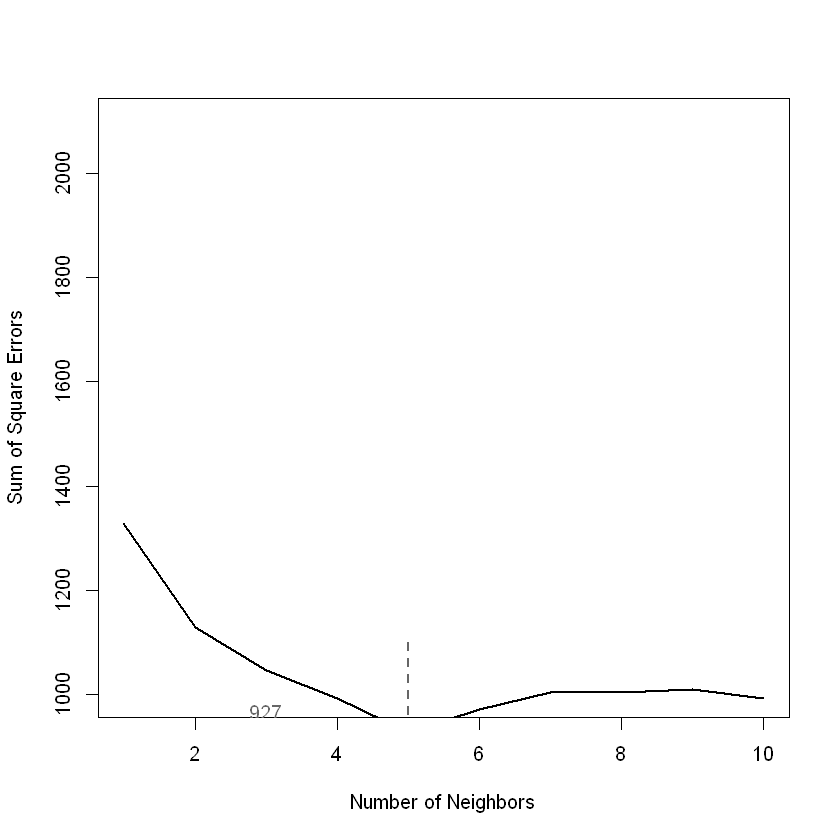

In [24]:
plot(y = err, x = (1:K),  type = "l", lwd= 2,
     ylim = c(1000, 2100),
     xlab = "Number of Neighbors",
     ylab = "Sum of Square Errors")

rmseMin = min(err)
kMin = which(err == rmseMin)[1]
segments(x0 = 0, x1 = kMin, y0 = rmseMin, col = gray(0.4), 
         lty = 2, lwd = 2)
segments(x0 = kMin, x1 = kMin, y0 = 1100,  y1 = rmseMin, 
         col = grey(0.4), lty = 2, lwd = 2)

#mtext(kMin, side = 1, line = 1, at = kMin, col = grey(0.4))
text(x = kMin - 2, y = rmseMin + 40, 
     label = as.character(round(rmseMin)), col = grey(0.4))

In [25]:
kMin

[1] 5

In [26]:
estXYk_best = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = kMin)

allMac_Best=calcError(estXYk_best, actualXY)
print(calcError(estXYk_best, actualXY))

     posXY posX posY 00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6
0-0    0-0    0    0         -71.76555         -52.37243         -66.13039
0-1    0-1    0    1         -70.47375         -52.98182         -65.37177
0-10  0-10    0   10         -70.12946         -56.34184         -65.67238
0-11  0-11    0   11         -70.62604         -54.73420         -67.17593
0-12  0-12    0   12         -68.84840         -56.03030         -70.46493
0-13  0-13    0   13         -73.49886         -54.55152         -71.19211
0-2    0-2    0    2         -70.88092         -54.56566         -61.18548
0-3    0-3    0    3         -70.42553         -55.16061         -61.41750
0-4    0-4    0    4         -67.58141         -51.16061         -64.98713
0-7    0-7    0    7         -67.19812         -54.92443         -66.44682
0-8    0-8    0    8         -67.31954         -54.12458         -67.17580
0-9    0-9    0    9         -65.17574         -50.61515         -67.24818
1-0    1-0    1    0     

[1] 209.6123


In [27]:
allMac_Best

[1] 209.6123

In [28]:
# with weight
estXYk_best = predXYW(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = kMin)

allMac_Best_weight=calcError(estXYk_best, actualXY)
print(calcError(estXYk_best, actualXY))

     posXY posX posY 00:0f:a3:39:dd:cd 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6
0-0    0-0    0    0         -71.76555         -52.37243         -66.13039
0-1    0-1    0    1         -70.47375         -52.98182         -65.37177
0-10  0-10    0   10         -70.12946         -56.34184         -65.67238
0-11  0-11    0   11         -70.62604         -54.73420         -67.17593
0-12  0-12    0   12         -68.84840         -56.03030         -70.46493
0-13  0-13    0   13         -73.49886         -54.55152         -71.19211
0-2    0-2    0    2         -70.88092         -54.56566         -61.18548
0-3    0-3    0    3         -70.42553         -55.16061         -61.41750
0-4    0-4    0    4         -67.58141         -51.16061         -64.98713
0-7    0-7    0    7         -67.19812         -54.92443         -66.44682
0-8    0-8    0    8         -67.31954         -54.12458         -67.17580
0-9    0-9    0    9         -65.17574         -50.61515         -67.24818
1-0    1-0    1    0     

[1] 209.2446


In [29]:
allMac_Best_weight

[1] 209.2446

In [30]:
# finish all Macs

In [31]:
offlineSummary_copy=offlineSummary

In [32]:
subMacs = c("00:0f:a3:39:e1:c0", "00:0f:a3:39:dd:cd", "00:14:bf:b1:97:8a",
            "00:14:bf:3b:c7:c6", "00:14:bf:b1:97:90", "00:14:bf:b1:97:8d",
            "00:14:bf:b1:97:81")

offlineSummary = subset(offlineSummary_copy, mac !=subMacs[2])
mac_number = length(unique(offlineSummary$mac))

In [33]:
######  C0  ########### remove 00:0f:a3:39:dd:cd

In [34]:
# tally signal strength

macs = unique(offlineSummary$mac)
online = readData("online.final.trace.txt", subMacs = macs)

online$posXY = paste(online$posX, online$posY, sep = "-")

length(unique(online$posXY))

tabonlineXYA = table(online$posXY, online$angle)
#tabonlineXYA[1:6, ]

keepVars = c("posXY", "posX","posY", "orientation", "angle")

byLoc = with(online, 
             by(online, list(posXY), 
                function(x) {
                  ans = x[1, keepVars]
                  avgSS = tapply(x$signal, x$mac, mean)
                  print(avgSS)
                  y = matrix(avgSS, nrow = 1, ncol = mac_number,
                             dimnames = list(ans$posXY, names(avgSS)))
                  cbind(ans, y)
                }))

onlineSummary = do.call("rbind", byLoc) 

[1] 60

00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -52.22727         -62.94898         -61.81395         -40.06897 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -63.04301         -55.23333 
00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -55.27523         -73.96190         -72.70103         -47.81308 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -69.45455         -46.88000 
00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -51.70909         -70.08247         -70.09890         -54.08824 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -69.13158         -53.88660 
00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -49.50000         -64.25806         -72.59770         -45.65289 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -60.79747         -49.58000 
00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -53.26364         -66.96000         -66

In [35]:
onlineSummary

,posXY,posX,posY,orientation,angle,00:0f:a3:39:e1:c0,00:14:bf:3b:c7:c6,00:14:bf:b1:97:81,00:14:bf:b1:97:8a,00:14:bf:b1:97:8d,00:14:bf:b1:97:90
0-0.05,0-0.05,0.00,0.05,130.5,135,-52.22727,-62.94898,-61.81395,-40.06897,-63.04301,-55.23333
0.15-9.42,0.15-9.42,0.15,9.42,112.3,90,-55.27523,-73.96190,-72.70103,-47.81308,-69.45455,-46.88000
0.31-11.09,0.31-11.09,0.31,11.09,230.1,225,-51.70909,-70.08247,-70.09890,-54.08824,-69.13158,-53.88660
0.47-8.2,0.47-8.2,0.47,8.20,5.8,0,-49.50000,-64.25806,-72.59770,-45.65289,-60.79747,-49.58000
0.78-10.94,0.78-10.94,0.78,10.94,348.3,0,-53.26364,-66.96000,-66.80952,-48.41379,-65.00000,-54.84694
0.93-11.69,0.93-11.69,0.93,11.69,158.3,180,-57.96364,-70.44340,-70.58025,-43.66346,-65.59302,-47.27083
1.08-12.19,1.08-12.19,1.08,12.19,229.1,225,-54.82727,-69.20192,-67.92553,-52.00820,-71.58696,-51.66667
1.24-3.93,1.24-3.93,1.24,3.93,261.5,270,-56.47273,-69.62745,-59.76136,-38.91753,-71.66667,-53.23333
1.39-6.61,1.39-6.61,1.39,6.61,114.1,135,-51.28182,-62.23913,-64.56627,-48.92381,-60.79798,-50.49057
1.52-9.32,1.52-9.32,1.52,9.32,7.0,0,-50.36697,-63.35922,-67.48913,-50.04167,-65.10345,-49.38542


In [36]:
max_col=ncol(onlineSummary)
max_col

[1] 11

In [37]:
estXYk3 = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = 3)

# nearest neighbor
estXYk1 = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = 1)

calcError = 
  function(estXY, actualXY) 
    sum( rowSums( (estXY - actualXY)^2) )

actualXY = onlineSummary[ , c("posX", "posY")]
sapply(list(estXYk1, estXYk3), calcError, actualXY)

     posXY posX posY 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -52.37243         -66.13039         -63.19262
0-1    0-1    0    1         -52.98182         -65.37177         -63.72941
0-10  0-10    0   10         -56.34184         -65.67238         -69.16041
0-11  0-11    0   11         -54.73420         -67.17593         -70.34538
0-12  0-12    0   12         -56.03030         -70.46493         -72.28758
0-13  0-13    0   13         -54.55152         -71.19211         -72.58496
0-2    0-2    0    2         -54.56566         -61.18548         -62.51073
0-3    0-3    0    3         -55.16061         -61.41750         -55.65519
0-4    0-4    0    4         -51.16061         -64.98713         -61.14729
0-7    0-7    0    7         -54.92443         -66.44682         -64.40728
0-8    0-8    0    8         -54.12458         -67.17580         -64.15794
0-9    0-9    0    9         -50.61515         -67.24818         -66.40694
1-0    1-0    1    0     

     posXY posX posY 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -52.37243         -66.13039         -63.19262
0-1    0-1    0    1         -52.98182         -65.37177         -63.72941
0-10  0-10    0   10         -56.34184         -65.67238         -69.16041
0-11  0-11    0   11         -54.73420         -67.17593         -70.34538
0-12  0-12    0   12         -56.03030         -70.46493         -72.28758
0-13  0-13    0   13         -54.55152         -71.19211         -72.58496
0-2    0-2    0    2         -54.56566         -61.18548         -62.51073
0-3    0-3    0    3         -55.16061         -61.41750         -55.65519
0-4    0-4    0    4         -51.16061         -64.98713         -61.14729
0-7    0-7    0    7         -54.92443         -66.44682         -64.40728
0-8    0-8    0    8         -54.12458         -67.17580         -64.15794
0-9    0-9    0    9         -50.61515         -67.24818         -66.40694
1-0    1-0    1    0     

[1] 659.4003 306.7025

In [38]:
# up to 20 neighbors, 11 folds
# this one can run for a while (5-10 mins)
# this cell and the next are the same, but the angles change slightly!!
offline_copy=offline

offline = offline_copy[ offline_copy$mac != "00:0f:a3:39:dd:cd", ]

keepVars = c("posXY", "posX","posY", "orientation", "angle")

onlineCVSummary = reshapeSS1(offline, keepVars = keepVars, 
                            sampleAngle = TRUE)

onlineFold = subset(onlineCVSummary, 
                    posXY %in% permuteLocs[ , 1])

offlineFold = subset(offlineSummary,
                     posXY %in% permuteLocs[ , -1])

estFold = predXY(newSignals = onlineFold[ , 6:max_col], 
                 newAngles = onlineFold[ , 4], 
                 offlineFold, numAngles = numAngles, k = 3)

# actualFold = onlineFold[ , c("posX", "posY")]
# calcError(estFold, actualFold)

     posXY posX posY 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -53.80909         -66.10015         -64.88307
0-1    0-1    0    1         -52.58485         -67.82385         -67.84945
0-10  0-10    0   10         -54.80303         -65.65221         -63.99890
0-11  0-11    0   11         -53.40909         -69.48721         -70.81912
0-12  0-12    0   12         -53.29697         -68.00955         -70.65218
0-3    0-3    0    3         -54.18788         -62.54893         -57.82939
0-4    0-4    0    4         -50.28173         -64.54059         -59.43641
0-7    0-7    0    7         -57.68835         -63.48006         -64.04872
0-8    0-8    0    8         -53.36364         -66.26208         -64.77995
0-9    0-9    0    9         -51.64545         -67.04494         -65.48288
1-0    1-0    1    0         -50.27879         -62.08381         -67.52109
1-1    1-1    1    1         -54.17642         -62.17845         -66.30730
1-10  1-10    1   10     

In [39]:
K = 10
err = rep(0, K)

for (j in 1:v) {
  onlineFold = subset(onlineCVSummary, 
                      posXY %in% permuteLocs[ , j])
  offlineFold = subset(offlineSummary,
                       posXY %in% permuteLocs[ , -j])
  actualFold = onlineFold[ , c("posX", "posY")]
  
  for (k in 1:K) {
    estFold = predXY(newSignals = onlineFold[ , 6:max_col],
                     newAngles = onlineFold[ , 4], 
                     offlineFold, numAngles = numAngles, k = k)
    err[k] = err[k] + calcError(estFold, actualFold)
  }
}

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



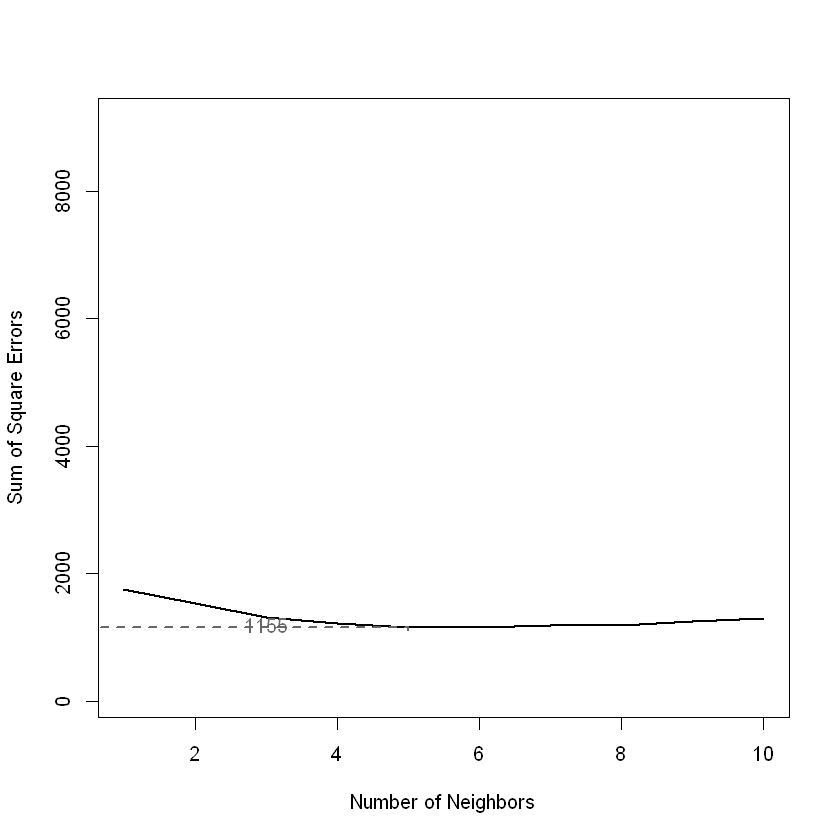

In [40]:
plot(y = err, x = (1:K),  type = "l", lwd= 2,
     ylim = c(100, 9100),
     xlab = "Number of Neighbors",
     ylab = "Sum of Square Errors")

rmseMin = min(err)
kMin = which(err == rmseMin)[1]
segments(x0 = 0, x1 = kMin, y0 = rmseMin, col = gray(0.4), 
         lty = 2, lwd = 2)
segments(x0 = kMin, x1 = kMin, y0 = 1100,  y1 = rmseMin, 
         col = grey(0.4), lty = 2, lwd = 2)

#mtext(kMin, side = 1, line = 1, at = kMin, col = grey(0.4))
text(x = kMin - 2, y = rmseMin + 40, 
     label = as.character(round(rmseMin)), col = grey(0.4))

In [41]:
estXYk_best = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = kMin)

no_cd_mac_best=calcError(estXYk_best, actualXY)
print(calcError(estXYk_best, actualXY))

     posXY posX posY 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -52.37243         -66.13039         -63.19262
0-1    0-1    0    1         -52.98182         -65.37177         -63.72941
0-10  0-10    0   10         -56.34184         -65.67238         -69.16041
0-11  0-11    0   11         -54.73420         -67.17593         -70.34538
0-12  0-12    0   12         -56.03030         -70.46493         -72.28758
0-13  0-13    0   13         -54.55152         -71.19211         -72.58496
0-2    0-2    0    2         -54.56566         -61.18548         -62.51073
0-3    0-3    0    3         -55.16061         -61.41750         -55.65519
0-4    0-4    0    4         -51.16061         -64.98713         -61.14729
0-7    0-7    0    7         -54.92443         -66.44682         -64.40728
0-8    0-8    0    8         -54.12458         -67.17580         -64.15794
0-9    0-9    0    9         -50.61515         -67.24818         -66.40694
1-0    1-0    1    0     

[1] 275.5083


In [42]:
no_cd_mac_best

[1] 275.5083

In [43]:
# with weight
estXYk_best = predXYW(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = kMin)

no_cd_mac_best_weight =calcError(estXYk_best, actualXY)
print(calcError(estXYk_best, actualXY))

     posXY posX posY 00:0f:a3:39:e1:c0 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -52.37243         -66.13039         -63.19262
0-1    0-1    0    1         -52.98182         -65.37177         -63.72941
0-10  0-10    0   10         -56.34184         -65.67238         -69.16041
0-11  0-11    0   11         -54.73420         -67.17593         -70.34538
0-12  0-12    0   12         -56.03030         -70.46493         -72.28758
0-13  0-13    0   13         -54.55152         -71.19211         -72.58496
0-2    0-2    0    2         -54.56566         -61.18548         -62.51073
0-3    0-3    0    3         -55.16061         -61.41750         -55.65519
0-4    0-4    0    4         -51.16061         -64.98713         -61.14729
0-7    0-7    0    7         -54.92443         -66.44682         -64.40728
0-8    0-8    0    8         -54.12458         -67.17580         -64.15794
0-9    0-9    0    9         -50.61515         -67.24818         -66.40694
1-0    1-0    1    0     

[1] 273.1212


In [44]:
no_cd_mac_best_weight

[1] 273.1212

In [45]:
######### cd #####  remove 00:0f:a3:39:e1:c0

In [46]:
subMacs = c("00:0f:a3:39:e1:c0", "00:0f:a3:39:dd:cd", "00:14:bf:b1:97:8a",
            "00:14:bf:3b:c7:c6", "00:14:bf:b1:97:90", "00:14:bf:b1:97:8d",
            "00:14:bf:b1:97:81")

offlineSummary = subset(offlineSummary_copy, mac !=subMacs[1])
mac_number = length(unique(offlineSummary$mac))

In [47]:
# tally signal strength

macs = unique(offlineSummary$mac)
online = readData("online.final.trace.txt", subMacs = macs)

online$posXY = paste(online$posX, online$posY, sep = "-")

length(unique(online$posXY))

tabonlineXYA = table(online$posXY, online$angle)
#tabonlineXYA[1:6, ]

keepVars = c("posXY", "posX","posY", "orientation", "angle")

byLoc = with(online, 
             by(online, list(posXY), 
                function(x) {
                  ans = x[1, keepVars]
                  avgSS = tapply(x$signal, x$mac, mean)
                  print(avgSS)
                  y = matrix(avgSS, nrow = 1, ncol = mac_number,
                             dimnames = list(ans$posXY, names(avgSS)))
                  cbind(ans, y)
                }))

onlineSummary = do.call("rbind", byLoc) 

[1] 60

00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -63.20721         -62.94898         -61.81395         -40.06897 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -63.04301         -55.23333 
00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -66.11712         -73.96190         -72.70103         -47.81308 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -69.45455         -46.88000 
00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -67.05405         -70.08247         -70.09890         -54.08824 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -69.13158         -53.88660 
00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -74.15315         -64.25806         -72.59770         -45.65289 
00:14:bf:b1:97:8d 00:14:bf:b1:97:90 
        -60.79747         -49.58000 
00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81 00:14:bf:b1:97:8a 
        -71.40367         -66.96000         -66

In [48]:
estXYk3 = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = 3)

# nearest neighbor
estXYk1 = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = 1)

calcError = 
  function(estXY, actualXY) 
    sum( rowSums( (estXY - actualXY)^2) )

actualXY = onlineSummary[ , c("posX", "posY")]
sapply(list(estXYk1, estXYk3), calcError, actualXY)

     posXY posX posY 00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -71.76555         -66.13039         -63.19262
0-1    0-1    0    1         -70.47375         -65.37177         -63.72941
0-10  0-10    0   10         -70.12946         -65.67238         -69.16041
0-11  0-11    0   11         -70.62604         -67.17593         -70.34538
0-12  0-12    0   12         -68.84840         -70.46493         -72.28758
0-13  0-13    0   13         -73.49886         -71.19211         -72.58496
0-2    0-2    0    2         -70.88092         -61.18548         -62.51073
0-3    0-3    0    3         -70.42553         -61.41750         -55.65519
0-4    0-4    0    4         -67.58141         -64.98713         -61.14729
0-7    0-7    0    7         -67.19812         -66.44682         -64.40728
0-8    0-8    0    8         -67.31954         -67.17580         -64.15794
0-9    0-9    0    9         -65.17574         -67.24818         -66.40694
1-0    1-0    1    0     

     posXY posX posY 00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -71.76555         -66.13039         -63.19262
0-1    0-1    0    1         -70.47375         -65.37177         -63.72941
0-10  0-10    0   10         -70.12946         -65.67238         -69.16041
0-11  0-11    0   11         -70.62604         -67.17593         -70.34538
0-12  0-12    0   12         -68.84840         -70.46493         -72.28758
0-13  0-13    0   13         -73.49886         -71.19211         -72.58496
0-2    0-2    0    2         -70.88092         -61.18548         -62.51073
0-3    0-3    0    3         -70.42553         -61.41750         -55.65519
0-4    0-4    0    4         -67.58141         -64.98713         -61.14729
0-7    0-7    0    7         -67.19812         -66.44682         -64.40728
0-8    0-8    0    8         -67.31954         -67.17580         -64.15794
0-9    0-9    0    9         -65.17574         -67.24818         -66.40694
1-0    1-0    1    0     

[1] 411.6403 270.4581

In [49]:
# up to 20 neighbors, 11 folds
# this one can run for a while (5-10 mins)
# this cell and the next are the same, but the angles change slightly!!

offline = offline_copy[ offline_copy$mac != "00:0f:a3:39:e1:c0", ]

keepVars = c("posXY", "posX","posY", "orientation", "angle")

onlineCVSummary = reshapeSS1(offline, keepVars = keepVars, 
                            sampleAngle = TRUE)

onlineFold = subset(onlineCVSummary, 
                    posXY %in% permuteLocs[ , 1])

offlineFold = subset(offlineSummary,
                     posXY %in% permuteLocs[ , -1])

estFold = predXY(newSignals = onlineFold[ , 6:max_col], 
                 newAngles = onlineFold[ , 4], 
                 offlineFold, numAngles = numAngles, k = 3)

actualFold = onlineFold[ , c("posX", "posY")]
calcError(estFold, actualFold)

     posXY posX posY 00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -69.17617         -65.70272         -66.74915
0-1    0-1    0    1         -72.01807         -65.80608         -68.19578
0-10  0-10    0   10         -68.96569         -63.64267         -64.00922
0-11  0-11    0   11         -69.71027         -67.61468         -66.12793
0-12  0-12    0   12         -68.54722         -65.86078         -69.58316
0-3    0-3    0    3         -68.87570         -65.59814         -56.62369
0-4    0-4    0    4         -66.78182         -63.73185         -58.73464
0-7    0-7    0    7         -69.54410         -64.29400         -64.04804
0-8    0-8    0    8         -66.67056         -63.90215         -63.30448
0-9    0-9    0    9         -67.18670         -65.62216         -63.73677
1-0    1-0    1    0         -70.77860         -63.01866         -68.76928
1-1    1-1    1    1         -68.46019         -65.02400         -64.75116
1-10  1-10    1   10     

[1] 112.5556

In [50]:
offline_copy

,time,posX,posY,orientation,mac,signal,rawTime,angle,posXY
1,2006-02-11 00:31:58,0,0,0,00:14:bf:b1:97:8a,-38,1.139643e+12,0,0-0
2,2006-02-11 00:31:58,0,0,0,00:14:bf:b1:97:90,-56,1.139643e+12,0,0-0
3,2006-02-11 00:31:58,0,0,0,00:0f:a3:39:e1:c0,-53,1.139643e+12,0,0-0
4,2006-02-11 00:31:58,0,0,0,00:14:bf:b1:97:8d,-65,1.139643e+12,0,0-0
5,2006-02-11 00:31:58,0,0,0,00:14:bf:b1:97:81,-65,1.139643e+12,0,0-0
6,2006-02-11 00:31:58,0,0,0,00:14:bf:3b:c7:c6,-66,1.139643e+12,0,0-0
7,2006-02-11 00:31:58,0,0,0,00:0f:a3:39:dd:cd,-75,1.139643e+12,0,0-0
12,2006-02-11 00:31:58,0,0,0,00:14:bf:b1:97:8a,-38,1.139643e+12,0,0-0
13,2006-02-11 00:31:58,0,0,0,00:0f:a3:39:e1:c0,-54,1.139643e+12,0,0-0
14,2006-02-11 00:31:58,0,0,0,00:14:bf:b1:97:90,-56,1.139643e+12,0,0-0


In [51]:
K = 10
err = rep(0, K)

for (j in 1:v) {
  onlineFold = subset(onlineCVSummary, 
                      posXY %in% permuteLocs[ , j])
  offlineFold = subset(offlineSummary,
                       posXY %in% permuteLocs[ , -j])
  actualFold = onlineFold[ , c("posX", "posY")]
  
  for (k in 1:K) {
    estFold = predXY(newSignals = onlineFold[ , 6:max_col],
                     newAngles = onlineFold[ , 4], 
                     offlineFold, numAngles = numAngles, k = k)
    err[k] = err[k] + calcError(estFold, actualFold)
  }
}

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



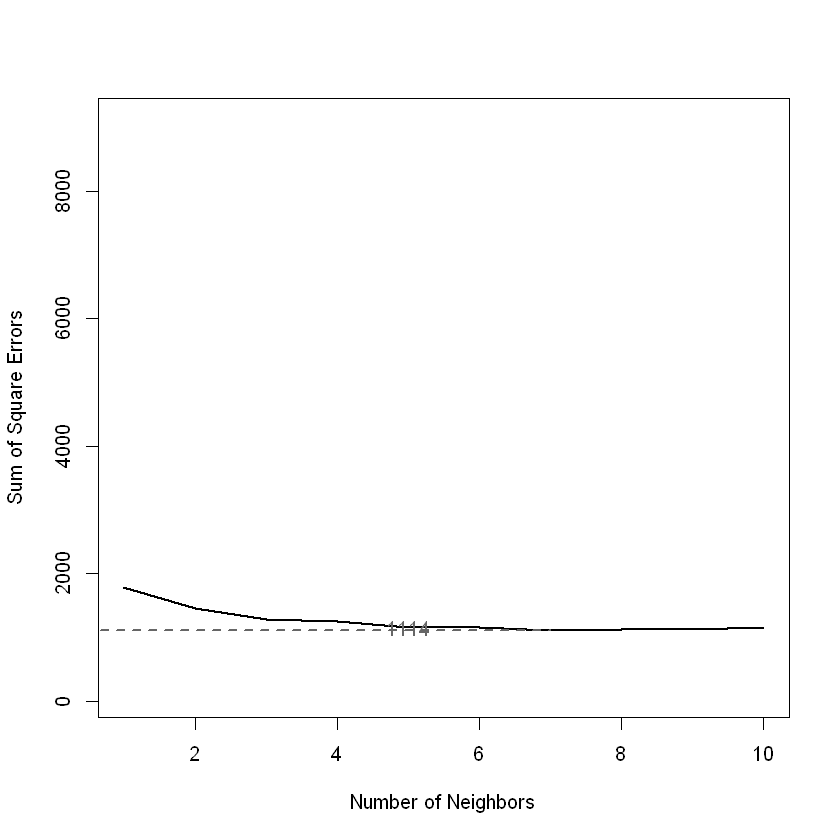

In [52]:
plot(y = err, x = (1:K),  type = "l", lwd= 2,
     ylim = c(100, 9100),
     xlab = "Number of Neighbors",
     ylab = "Sum of Square Errors")

rmseMin = min(err)
kMin = which(err == rmseMin)[1]
segments(x0 = 0, x1 = kMin, y0 = rmseMin, col = gray(0.4), 
         lty = 2, lwd = 2)
segments(x0 = kMin, x1 = kMin, y0 = 1100,  y1 = rmseMin, 
         col = grey(0.4), lty = 2, lwd = 2)

#mtext(kMin, side = 1, line = 1, at = kMin, col = grey(0.4))
text(x = kMin - 2, y = rmseMin + 40, 
     label = as.character(round(rmseMin)), col = grey(0.4))

In [53]:
kMin

[1] 7

In [54]:
estXYk_best = predXY(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = kMin)

noc0_mac_best=calcError(estXYk_best, actualXY)
print(calcError(estXYk_best, actualXY))

     posXY posX posY 00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -71.76555         -66.13039         -63.19262
0-1    0-1    0    1         -70.47375         -65.37177         -63.72941
0-10  0-10    0   10         -70.12946         -65.67238         -69.16041
0-11  0-11    0   11         -70.62604         -67.17593         -70.34538
0-12  0-12    0   12         -68.84840         -70.46493         -72.28758
0-13  0-13    0   13         -73.49886         -71.19211         -72.58496
0-2    0-2    0    2         -70.88092         -61.18548         -62.51073
0-3    0-3    0    3         -70.42553         -61.41750         -55.65519
0-4    0-4    0    4         -67.58141         -64.98713         -61.14729
0-7    0-7    0    7         -67.19812         -66.44682         -64.40728
0-8    0-8    0    8         -67.31954         -67.17580         -64.15794
0-9    0-9    0    9         -65.17574         -67.24818         -66.40694
1-0    1-0    1    0     

[1] 258.075


In [55]:
noc0_mac_best

[1] 258.075

In [56]:
# with weight
estXYk_best = predXYW(newSignals = onlineSummary[ , 6:max_col], 
                 newAngles = onlineSummary[ , 4], 
                 offlineSummary, numAngles = numAngles, k = kMin)

noc0_mac_weight_best=calcError(estXYk_best, actualXY)
print(calcError(estXYk_best, actualXY))

     posXY posX posY 00:0f:a3:39:dd:cd 00:14:bf:3b:c7:c6 00:14:bf:b1:97:81
0-0    0-0    0    0         -71.76555         -66.13039         -63.19262
0-1    0-1    0    1         -70.47375         -65.37177         -63.72941
0-10  0-10    0   10         -70.12946         -65.67238         -69.16041
0-11  0-11    0   11         -70.62604         -67.17593         -70.34538
0-12  0-12    0   12         -68.84840         -70.46493         -72.28758
0-13  0-13    0   13         -73.49886         -71.19211         -72.58496
0-2    0-2    0    2         -70.88092         -61.18548         -62.51073
0-3    0-3    0    3         -70.42553         -61.41750         -55.65519
0-4    0-4    0    4         -67.58141         -64.98713         -61.14729
0-7    0-7    0    7         -67.19812         -66.44682         -64.40728
0-8    0-8    0    8         -67.31954         -67.17580         -64.15794
0-9    0-9    0    9         -65.17574         -67.24818         -66.40694
1-0    1-0    1    0     

[1] 248.3535


In [57]:
noc0_mac_weight_best

[1] 248.3535